In [23]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os 
import re
import pandas as pd
import scipy.stats as stats


In [3]:
path = 'C:/Users/tssan/OneDrive/Desktop/EngPsych/scanVis/saliency_maps/saliency_maps'
contents = os.listdir(path)
fNames  = contents[:]
for i in range(len(contents)): contents[i] = path + "/" +contents[i] 
att =  contents

scans = []
for i in att: 
    scans.append(np.load(i))


contents = os.listdir(path)

# Prepend the full path to each filename
file_paths = [os.path.join(path, filename) for filename in contents]

# Load each file and collect the filename and its data
scans = []
for file_path in file_paths:
    scan_data = np.load(file_path)
    scans.append({'filename': os.path.basename(file_path), 'scan_data': scan_data})

# Convert the list of dictionaries into a DataFrame
df_scans = pd.DataFrame(scans)

print(df_scans.head())  # Display the first few rows of the DataFrame to verify the results
scan_data_only = df_scans['scan_data']
df_scans['BD#'] = df_scans['filename'].str.extract('(\d+)').astype(int)
print(df_scans)

df_excel =pd.read_excel('C:/Users/tssan/OneDrive/Desktop/EngPsych/scanVis/Filtered_BD_Data.xlsx') 
df_excel['BD#'] = df_excel['BD#'].str.extract('(\d+)').astype(int)

df = pd.merge(df_excel, df_scans, on='BD#', how='inner')

# Display the resulting DataFrame

                filename                                          scan_data
0  attribution_np100.npy  [[[[[-4.1172712e-04 -3.5331634e-04 -6.3405378e...
1  attribution_np101.npy  [[[[[-3.77254124e-04 -3.72937357e-04 -6.325342...
2  attribution_np102.npy  [[[[[-4.5300758e-04 -4.9075752e-04 -7.6694391e...
3  attribution_np106.npy  [[[[[-4.7299665e-04 -5.3812430e-04 -8.0747379e...
4  attribution_np109.npy  [[[[[-5.0638849e-04 -5.1031122e-04 -8.2751259e...
                  filename                                          scan_data  \
0    attribution_np100.npy  [[[[[-4.1172712e-04 -3.5331634e-04 -6.3405378e...   
1    attribution_np101.npy  [[[[[-3.77254124e-04 -3.72937357e-04 -6.325342...   
2    attribution_np102.npy  [[[[[-4.5300758e-04 -4.9075752e-04 -7.6694391e...   
3    attribution_np106.npy  [[[[[-4.7299665e-04 -5.3812430e-04 -8.0747379e...   
4    attribution_np109.npy  [[[[[-5.0638849e-04 -5.1031122e-04 -8.2751259e...   
..                     ...                                

In [26]:
def plotScanArb(data, slice_indices):
    volume = data.squeeze()  # Assuming data might have extra singleton dimensions.

    xy, xz, yz = slice_indices  # Unpack the list of slice indices for each plane.

    # Set up the plot
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Plot three orthogonal slices from the 3D volume
    ax[0].imshow(volume[xy], cmap='viridis')
    ax[0].set_title(f'Slice {xy} XY Plane')
    ax[0].axis('off')

    ax[1].imshow(volume[:, xz, :], cmap='viridis')
    ax[1].set_title(f'Slice {xz} XZ Plane')
    ax[1].axis('off')

    ax[2].imshow(volume[:, :, yz], cmap='viridis')
    ax[2].set_title(f'Slice {yz} YZ Plane')
    ax[2].axis('off')

    # Show the plot
    plt.tight_layout()
    plt.show()


In [4]:
def salSlice(attribution_data):
    attribution_3d = attribution_data.squeeze()

    # Compute the sum of absolute values for each slice in each plane
    sum_xz = np.sum(np.abs(attribution_3d), axis=0)  # Sum over X-axis, get XZ slices
    sum_xy = np.sum(np.abs(attribution_3d), axis=2)  # Sum over Z-axis, get XY slices
    sum_yz = np.sum(np.abs(attribution_3d), axis=1)  # Sum over Y-axis, get YZ slices

    # Find the indices of the most salient slice in each plane
    most_salient_xz = np.argmax(np.sum(sum_xz, axis=0))  # Most salient XZ slice
    most_salient_xy = np.argmax(np.sum(sum_xy, axis=0))  # Most salient XY slice
    most_salient_yz = np.argmax(np.sum(sum_yz, axis=0))  # Most salient YZ slice

    return [most_salient_xz, most_salient_xy, most_salient_yz]

In [36]:
scan_data_only = df['scan_data']
sal = np.array([salSlice(np.array(scan)) for scan in scan_data_only])

df["XZ"] = sal[:,0]
df["XY"] = sal[:,1]
df["YZ"] = sal[:,2]

HC = df[df['Dx'] == 'HC']
BD = df[df['Dx'] != 'HC']

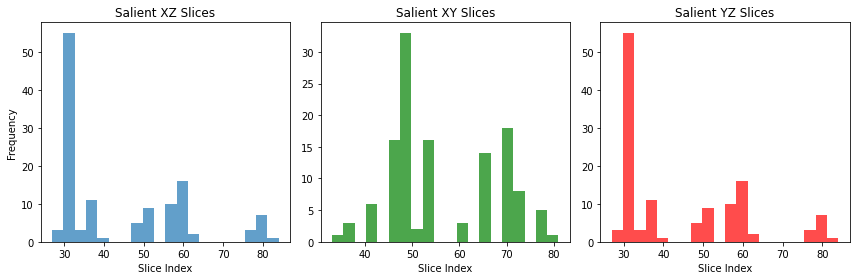

In [56]:

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.hist(sal[:, 0], bins=20, alpha=0.7, label='XZ Plane')
plt.title('Salient XZ Slices')
plt.xlabel('Slice Index')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(sal[:, 1], bins=20, alpha=0.7, color='green', label='XY Plane')
plt.title('Salient XY Slices')
plt.xlabel('Slice Index')

plt.subplot(1, 3, 3)
plt.hist(sal[:, 2], bins=20, alpha=0.7, color='red', label='YZ Plane')
plt.title('Salient YZ Slices')
plt.xlabel('Slice Index')

plt.tight_layout()
plt.show()


NameError: name 'Line2D' is not defined

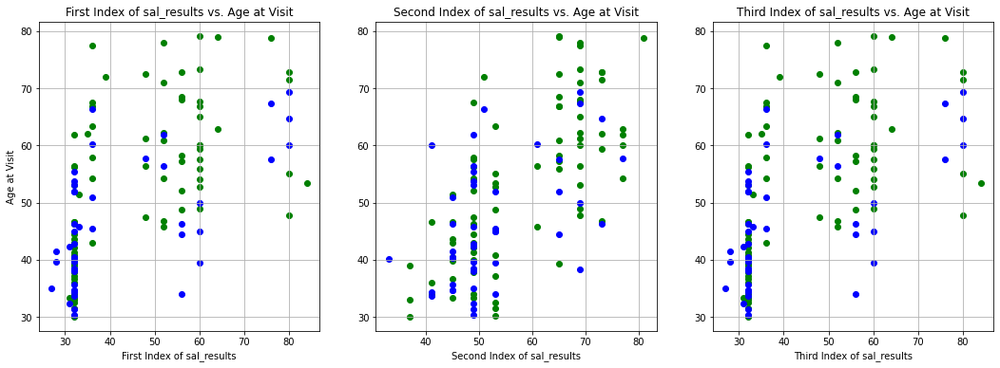

In [55]:
# Generate a list of colors based on the 'Dx' value
colors = ['green' if dx == 'HC' else 'blue' for dx in df['Dx']]

# Create plots for the first, second, and third indices
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Plotting for the first index
for i in range(len(df)):
    ax1.scatter(df['XZ'].iloc[i], df['Age at Visit'].iloc[i], color=colors[i], label=f"{df['Dx'].iloc[i]} (Index: {i})")
ax1.set_title('First Index of sal_results vs. Age at Visit')
ax1.set_xlabel('First Index of sal_results')
ax1.set_ylabel('Age at Visit')
ax1.grid(True)

# Plotting for the second index
for i in range(len(df)):
    ax2.scatter(df['XY'].iloc[i], df['Age at Visit'].iloc[i], color=colors[i], label=f"{df['Dx'].iloc[i]} (Index: {i})")
ax2.set_title('Second Index of sal_results vs. Age at Visit')
ax2.set_xlabel('Second Index of sal_results')
ax2.grid(True)

# Plotting for the third index
for i in range(len(df)):
    ax3.scatter(df['YZ'].iloc[i], df['Age at Visit'].iloc[i], color=colors[i], label=f"{df['Dx'].iloc[i]} (Index: {i})")
ax3.set_title('Third Index of sal_results vs. Age at Visit')
ax3.set_xlabel('Third Index of sal_results')
ax3.grid(True)

# Adding custom legend for clarity
legend_elements = [Line2D([0], [0], marker='o', color='w', label='HC', markerfacecolor='green', markersize=10),
                   Line2D([0], [0], marker='o', color='w', label='Not HC', markerfacecolor='blue', markersize=10)]
fig.legend(handles=legend_elements, loc='upper right')

plt.tight_layout()
plt.show()

**T-TEST**

In [24]:
columns_to_test = ['XZ', 'XY', 'YZ']

# Dictionary to hold p-values
p_values = {}

# Perform t-test for each column
for column in columns_to_test:
    # Split data into two groups
    group_HC = df[df['Dx'] == 'HC'][column]
    group_BD = df[df['Dx'] == 'BD'][column]

    # Perform t-test
    t_stat, p_value = stats.ttest_ind(group_HC, group_BD, equal_var=False)  # Welch's t-test for unequal variances
    p_values[column] = p_value

# Output the results
print("P-values for each saliency column:")
for column, p_value in p_values.items():
    print(f"{column}: {p_value:.4f}")

P-values for each saliency column:
XZ: 0.1378
XY: 0.0085
YZ: 0.1378


**BD PATIENTS**

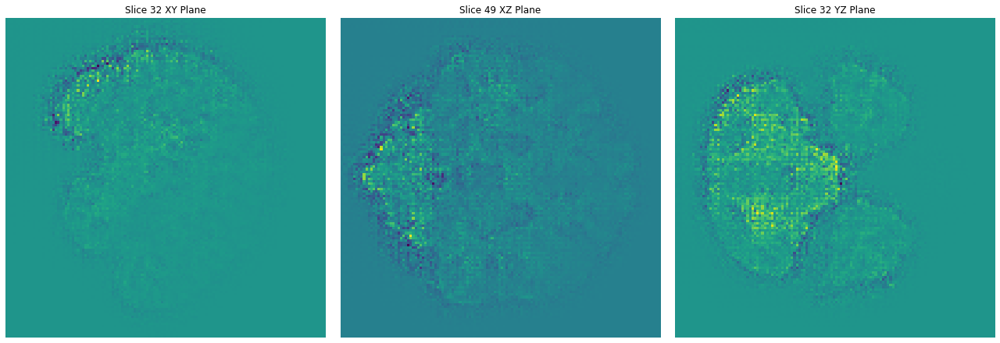

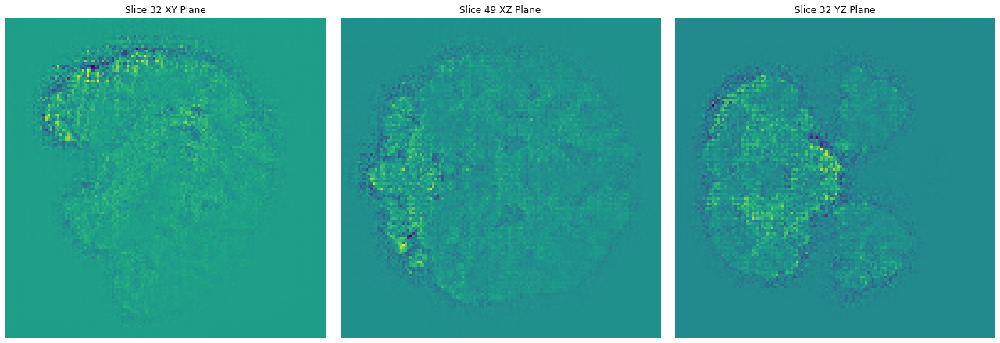

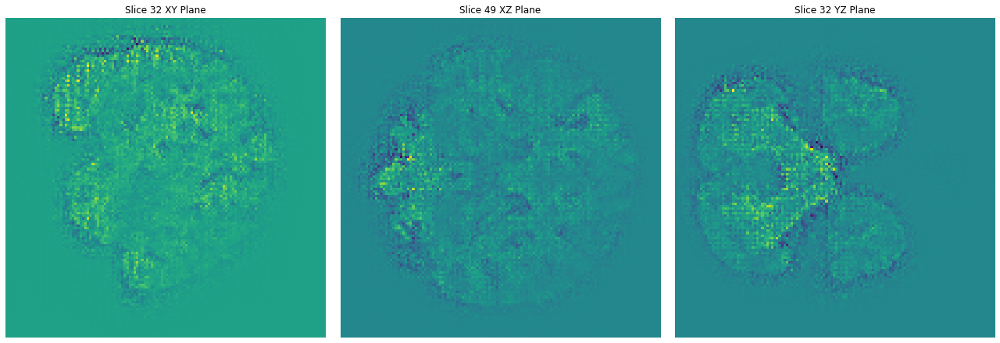

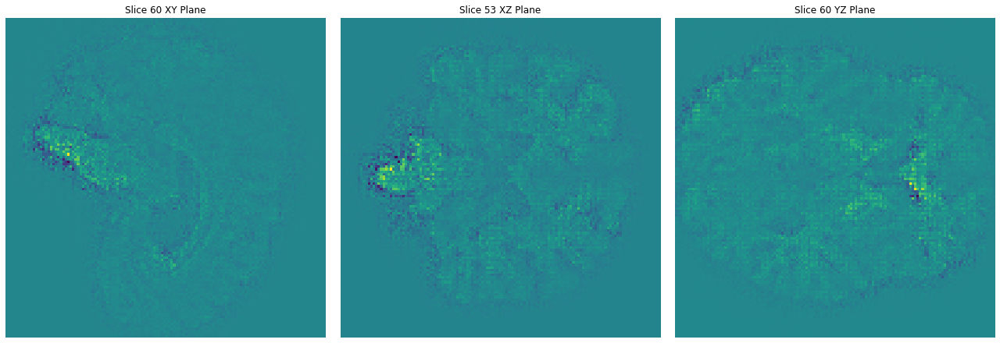

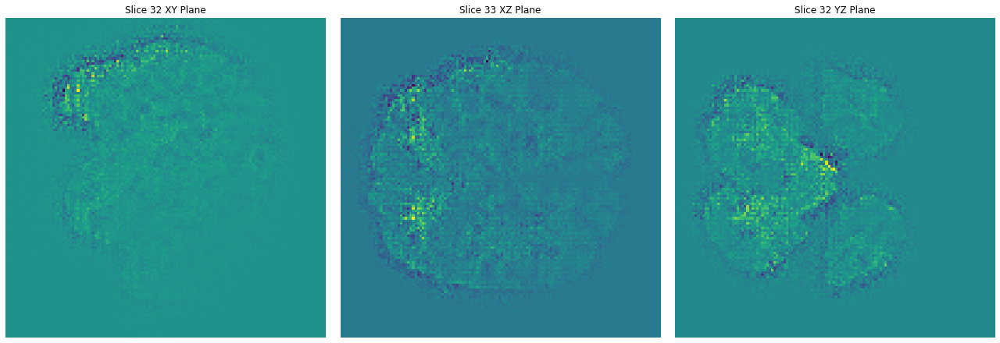

...

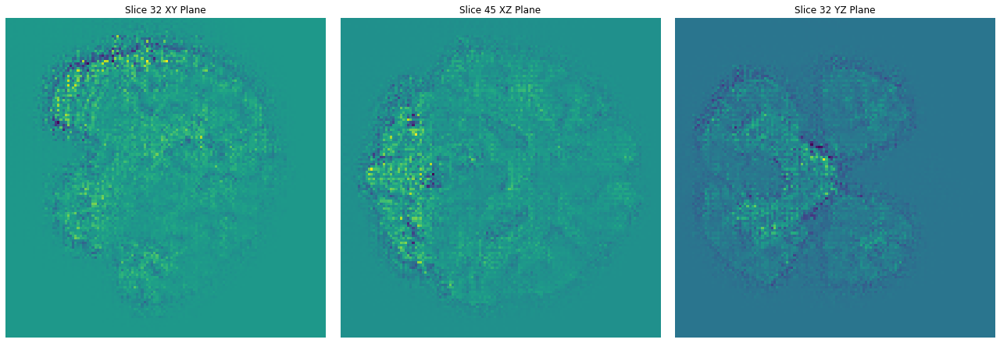

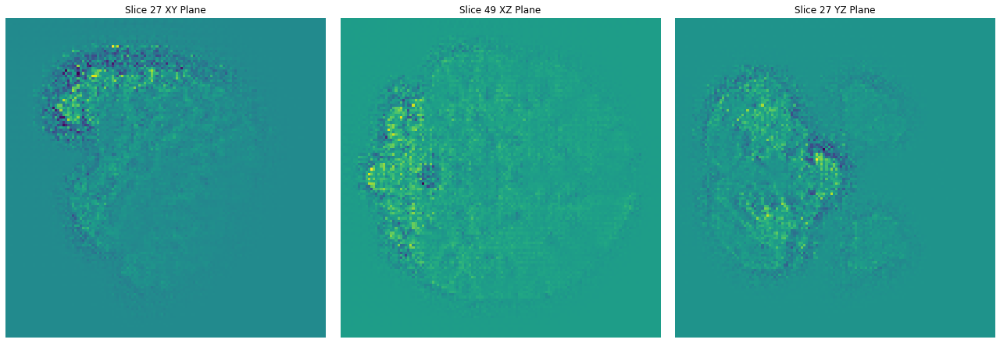

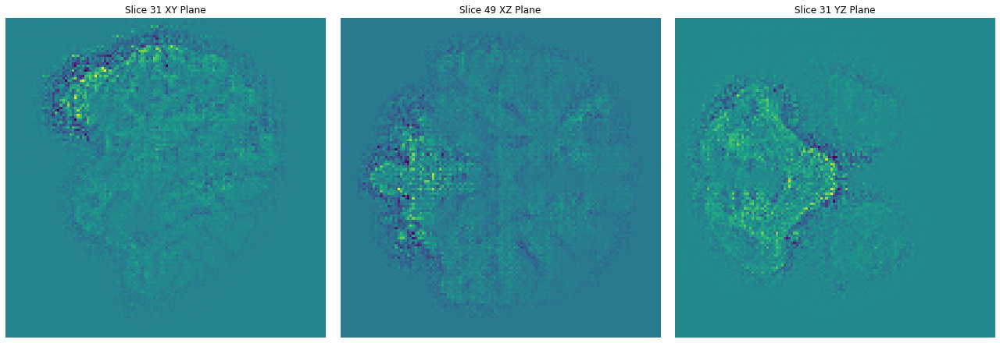

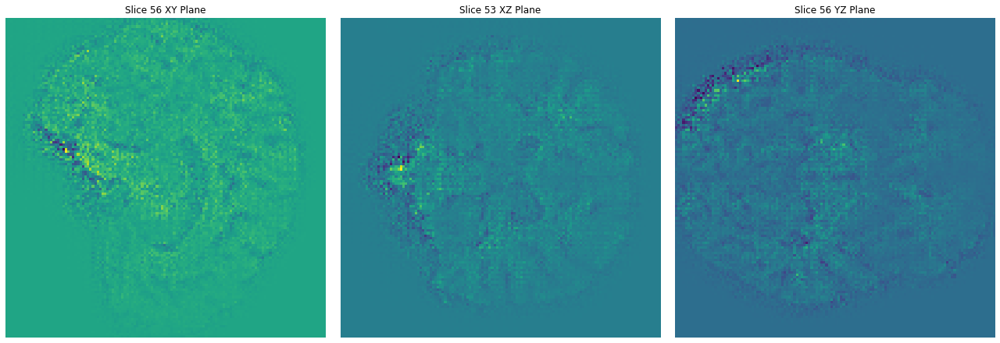

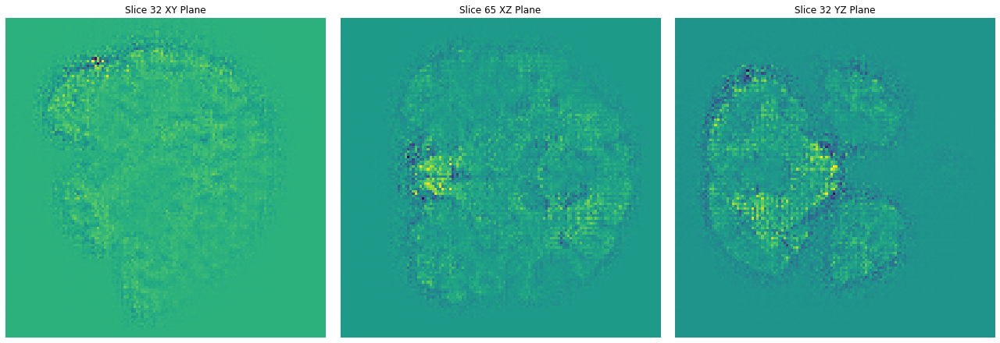

In [53]:
"""MOST SALIENT SLICES"""

for i in range(len(BD)):
    temp = BD.iloc[i,:]
    plotScanArb(temp[6], [temp[7],temp[8],temp[9] ] )

**HC PATIENTS**

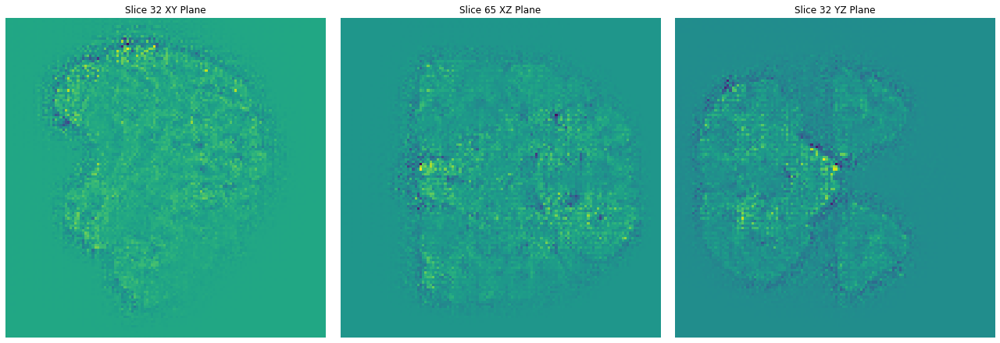

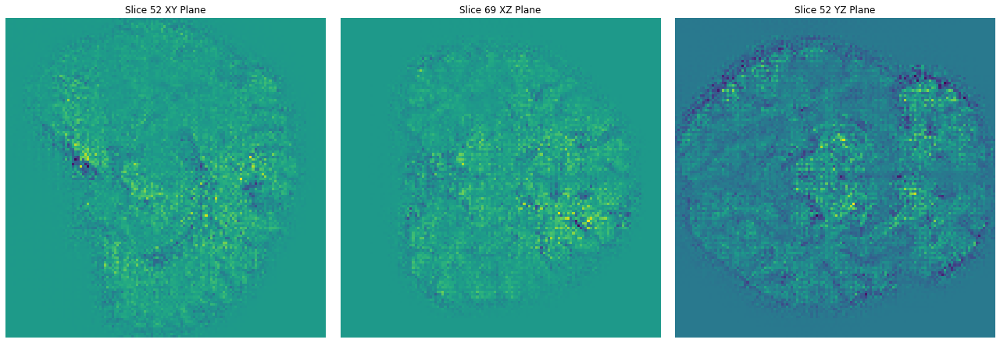

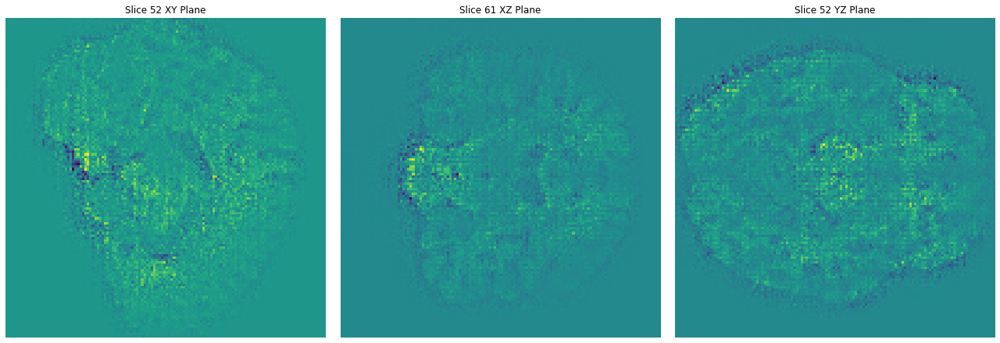

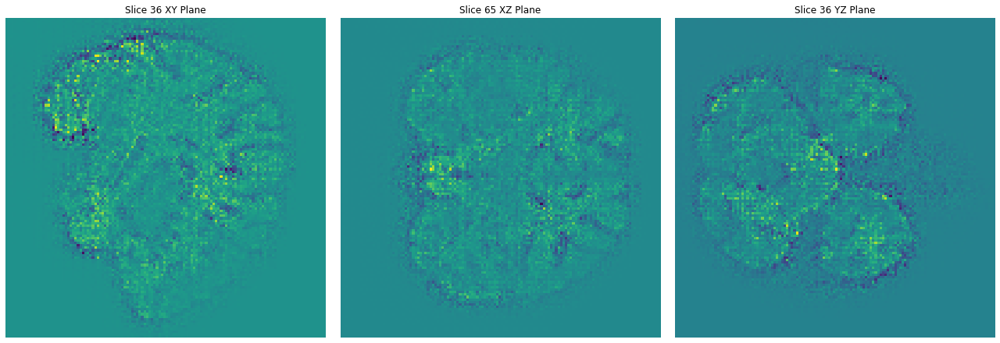

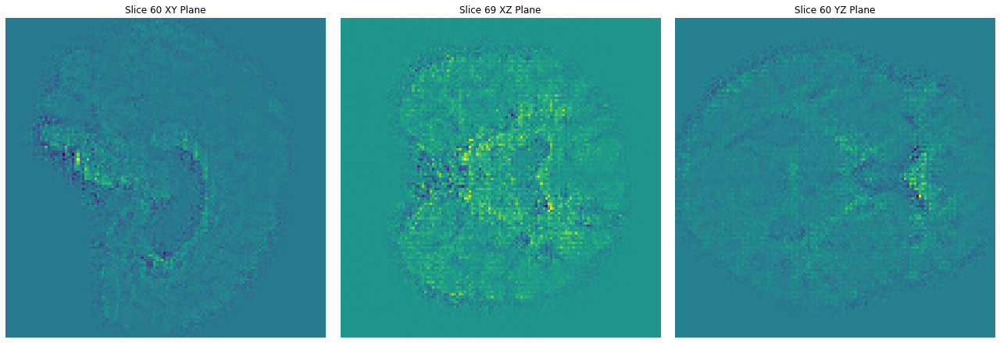

...

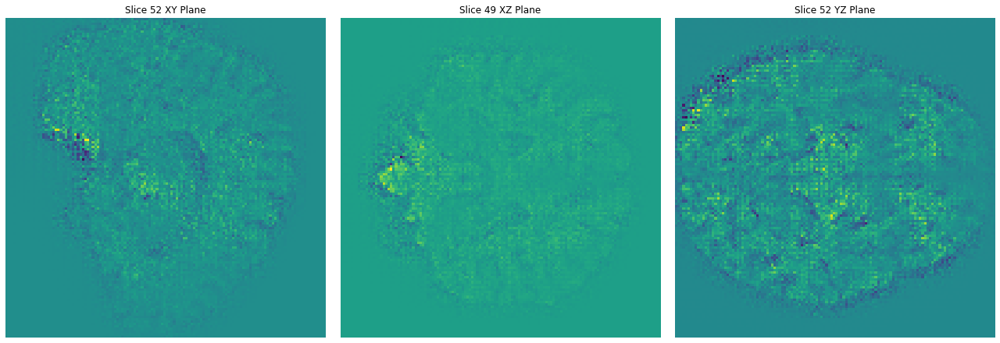

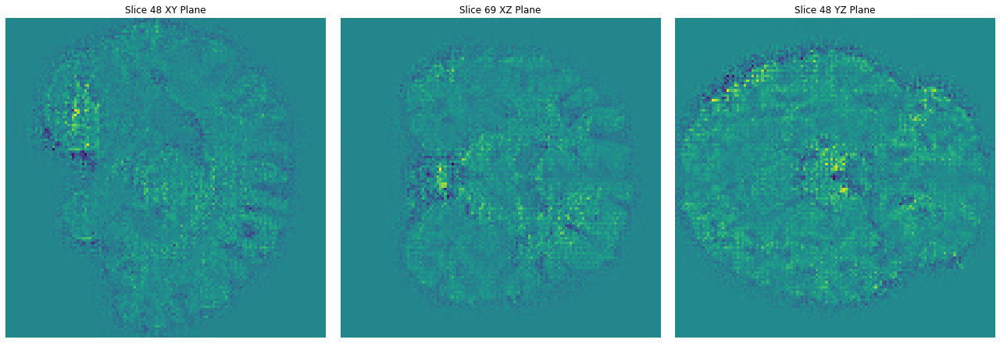

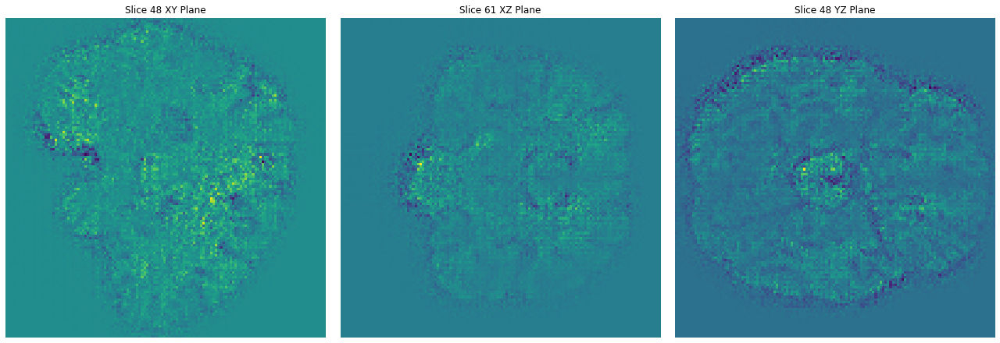

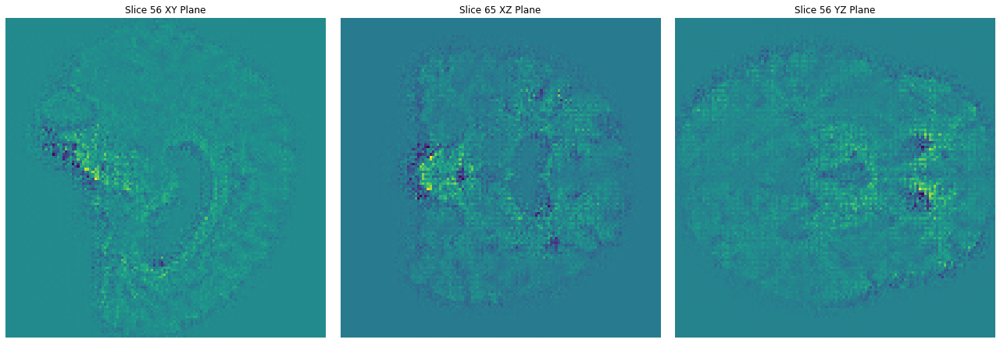

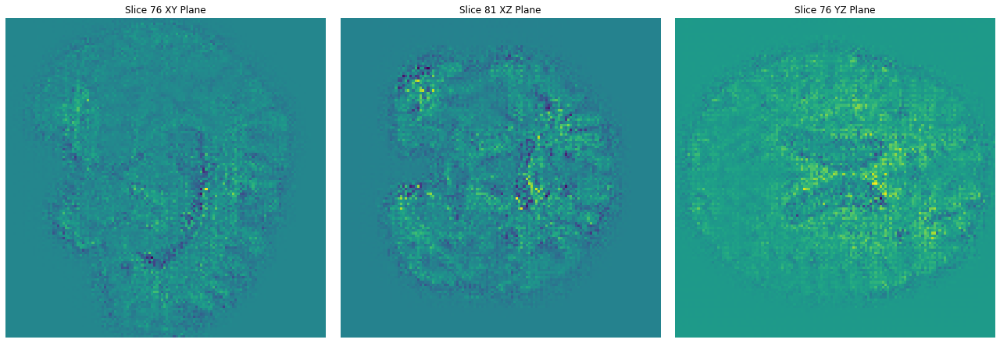

In [54]:
"""MOST SALIENT SLICES"""

for i in range(len(HC)):
    temp = HC.iloc[i,:]
    plotScanArb(temp[6], [temp[7],temp[8],temp[9] ] )

In [ ]:
plotScanArb(scan_data_only[2], [1,1,1])

# Example data creation
data = scan_data_only[1]

# Squeeze data to remove dimensions of size 1
data = data.squeeze()

# Create a figure for plotting
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Normalize data for transparency mapping
data_normalized = data / data.max()

# Create a color mapping based on saliency
colors = np.empty(data.shape, dtype=object)
for i in range(data.shape[0]):
    for j in range(data.shape[1]):
        for k in range(data.shape[2]):
            colors[i, j, k] = (1, 0, 0, data_normalized[i, j, k])  # Red color with variable alpha

# Plotting the voxels
ax.voxels(data > data.mean(), facecolors=colors, edgecolor='k')

# Set labels and title if necessary
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Saliency Map')

# Show plot
plt.show()